## Load Raw Data

This Notebook retrieves Energylogs and Trendlogs of specified meters, which is then merged into a single DataFrame.
A maximum of 12 meters has been selected to ensure the ratelimit of requests is not exceeded. 

Current Issues yet to be fixed:

ReactiveEnergy; ActiveEnergyExport; and ReactiveEnergyExport Energylogs have not been found from running 'rawData.py'. Instances for these trendlogs are available on Optergy, check whether data is exists.

Check whether Data Entries with NaN in: 'Current_A', 'NeutralCurrent_A','Power_W', 'ApparentPower_VA', 'ReactivePower_VAr','PowerFactor', 'Frequency_Hz' match with Optergy Data. 


In [ ]:
# Only installed once
# !pip install ratelimit

Maximum of 12 meters are selected per run 
Meters:10400-11500 (inclusive)
StartDate: 01/05/2020
EndDate: 30/09/2020
analyse meters: 10000,10100,17600 separately from the other meters 

In [1]:
StartDate = '01/05/2020'
EndDate = '30/09/2020'

In [2]:
%%time
## Get Raw Data
### Merge into single dataframe
%run -i "rawData.py"

In [3]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 176220 entries, 0 to 176219
Data columns (total 10 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   time                          176220 non-null  object 
 1   meter                         176220 non-null  int64  
 2   ActiveEnergy_consumption_kWh  176220 non-null  float64
 3   Current_A                     119651 non-null  float64
 4   NeutralCurrent_A              119651 non-null  float64
 5   Power_W                       119651 non-null  float64
 6   ApparentPower_VA              119651 non-null  float64
 7   ReactivePower_VAr             119651 non-null  float64
 8   PowerFactor                   119651 non-null  float64
 9   Frequency_Hz                  119651 non-null  float64
dtypes: float64(8), int64(1), object(1)
memory usage: 14.8+ MB


In [5]:
### Correlation between variables 
# raw_df.corr()
# raw_df.head(5)

## Clean DataFrame 

In [4]:
#Ordering Categories 
cat = ["January","February","March","April","May","June","July","August","September","October","November","December"]
cats = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Convert 'time' into timestamps
raw_df['time'] = pd.to_datetime(raw_df['time'])
raw_df['month'] = raw_df['time'].dt.strftime('%B')
raw_df['month'] = pd.Categorical(raw_df['month'],categories = cat, ordered = True)
raw_df['week'] = raw_df['time'].dt.strftime('%W')  # Monday as start of week
raw_df['week'] = raw_df['week'].astype('int64')
raw_df['day'] = raw_df['time'].dt.strftime('%A')
raw_df['day'] =  pd.Categorical(raw_df['day'],categories = cats, ordered = True)
raw_df['weekday'] = (raw_df["day"] != 'Saturday') & (raw_df["day"] != 'Sunday')
raw_df['hour'] = raw_df['time'].dt.hour

time_interval = raw_df['time'].max()-raw_df['time'].min()
print("start:",raw_df['time'].min(), "\nend:",raw_df['time'].max(), "\nduration:", time_interval)

start: 2020-05-01 00:00:00 
end: 2020-09-30 23:00:00 
duration: 152 days 23:00:00


In [5]:
###Seasons 
raw_df.loc[((raw_df['month'] == 'December') | (raw_df['month'] == 'January')| (raw_df['month'] == 'February')),'season'] = 'Summer'
raw_df.loc[((raw_df['month'] == 'March') | (raw_df['month'] == 'April') | (raw_df['month'] == 'May')),'season'] = 'Autumn'
raw_df.loc[((raw_df['month'] == 'June') | (raw_df['month'] == 'July')| (raw_df['month'] == 'August')),'season'] = 'Winter'
raw_df.loc[((raw_df['month'] == 'September') | (raw_df['month'] == 'October')| (raw_df['month'] == 'November')),'season'] = 'Spring'

In [6]:
### Rearrange columns of dataframe
raw_df = raw_df[['time','season','month','week','day','weekday','hour','meter','ActiveEnergy_consumption_kWh','Current_A', 'NeutralCurrent_A','Power_W', 'ApparentPower_VA',
                 'ReactivePower_VAr','PowerFactor', 'Frequency_Hz']]

### Final raw_df including all variables
# raw_df = raw_df[['time','month','week','day','weekday','hour','meter','ActiveEnergy_consumption_kWh','ReactiveEnergy_VAR','ActiveEnergyExport_kWh','ReactiveEnergyExport_kWh','Current_A', 'NeutralCurrent_A','Power_W', 'ApparentPower_kVA',
#                  'ReactivePower_kVAr','PowerFactor', 'Frequency_Hz']]


In [7]:
raw_df.head(5)

,time,season,month,week,day,weekday,hour,meter,ActiveEnergy_consumption_kWh,Current_A,NeutralCurrent_A,Power_W,ApparentPower_VA,ReactivePower_VAr,PowerFactor,Frequency_Hz
0,2020-05-01 00:00:00,Autumn,May,17,Friday,True,0,10400,0.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-05-01 00:15:00,Autumn,May,17,Friday,True,0,10400,0.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-05-01 00:30:00,Autumn,May,17,Friday,True,0,10400,0.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2020-05-01 00:45:00,Autumn,May,17,Friday,True,0,10400,0.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2020-05-01 01:00:00,Autumn,May,17,Friday,True,1,10400,0.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Analysis of Data
Create individual dataframes per variable to be analysed from the single raw_df DataFrame

In [8]:
### Create Pivot Tables
col_names = ['ActiveEnergy_consumption_kWh', 'Current_A', 'Power_W', 'ApparentPower_VA',
             'ReactivePower_VAr', 'Frequency_Hz']
months = list(raw_df["month"].unique())

In [9]:
### Pivot Tables for ActiveEnergy_consumption_kWh
# Below pivot tables used for plots 

pivot = raw_df.pivot_table(values='ActiveEnergy_consumption_kWh',index='time', columns='meter')

###Total consumption for the hour
hourly_consumption = pivot.resample("H").sum() 
hourly_stat = hourly_consumption.agg([np.sum,np.mean,np.std,np.min,np.max])

### Total consumption on each day 
daily = hourly_consumption.resample("D")
daily_total  = daily.sum() 
daily_stat = daily.agg([np.sum,np.mean,np.std,np.min,np.max])

### Total consumption for the month 
monthly= daily_total.resample("M")
monthly_total = monthly.sum(min_count=28)
monthly_total = monthly_total.set_index([pd.Index(range(len(months)))])
monthly_total.insert(0,"month",months)
monthly_stat = monthly.agg([np.sum,np.mean,np.std,np.min,np.max])

In [10]:
monthly_total

meter,month,10400,10500,10600,10700,10800,10900,11000,11100,11200,11300,11400,11500
0,May,43.929999,47.329999,67.509999,40.439999,100.329998,38.649999,34.049999,43.389999,39.649999,47.179999,21.860000,43.089999
1,June,129.629997,40.359999,76.729998,134.099997,96.849998,41.319999,36.099999,71.139999,93.029998,93.459998,64.889999,49.169999
2,July,137.359997,113.469998,83.379998,106.899998,100.869998,123.549998,98.809998,66.179999,62.079999,103.179998,56.739999,77.329998
3,August,29.979999,90.749998,51.799999,62.529999,54.409999,33.429999,80.789998,71.649999,79.969998,64.639999,58.699999,101.069998
4,September,13.440000,66.059999,172.429997,27.979999,43.009999,15.630000,84.779998,88.199998,28.479999,120.199998,31.279999,83.269998


### Energy Consumption_df  DataFrame
Slice DataFrame to different sampling Frequencies which will be used to display different visual plots. 
Conditions can be added to obtain further data, the ones below are still basic. 

In [11]:
### Energy Consumption dataframe
EnergyConsumption_df = raw_df.loc[:,'time':'ActiveEnergy_consumption_kWh']
EnergyConsumption_df["time_hourly"] = EnergyConsumption_df["time"].dt.to_period("H")
EnergyConsumption_df["time_day"] = EnergyConsumption_df["time"].dt.to_period("D")
EnergyConsumption_df['time_month'] = EnergyConsumption_df['time'].dt.to_period('M')

### Monthly Timestamps
E_monthly = EnergyConsumption_df.groupby(['meter','time_month'])['ActiveEnergy_consumption_kWh'].sum().reset_index()
E_monthly['month'] = E_monthly['time_month'].dt.strftime('%B')
E_monthly['month'] = pd.Categorical(E_monthly['month'],categories = cat, ordered = True)

### Daily Timestamps
E_daily = EnergyConsumption_df.groupby(['meter','time_day'])['ActiveEnergy_consumption_kWh'].sum().reset_index()
E_daily['month'] = E_daily['time_day'].dt.strftime('%B')
E_daily['month'] = pd.Categorical(E_daily['month'],categories = cat, ordered = True)
E_daily['day'] = E_daily['time_day'].dt.strftime('%A')
E_daily['day'] =  pd.Categorical(E_daily['day'],categories = cats, ordered = True)
E_daily['week'] = E_daily['time_day'].dt.strftime('%W')  # Monday as start of week
E_daily['week'] = E_daily['week'].astype('int64')

### Hourly Timestamps
EnergyConsumption_df = EnergyConsumption_df.groupby(["meter",'time_hourly'])['ActiveEnergy_consumption_kWh'].sum().reset_index()

EnergyConsumption_df["0.5kWh<x<2.0Wh"] =(EnergyConsumption_df['ActiveEnergy_consumption_kWh'] > 0.5) & (EnergyConsumption_df['ActiveEnergy_consumption_kWh'] <= 2.0)
EnergyConsumption_df[">2.0kWh"] =(EnergyConsumption_df['ActiveEnergy_consumption_kWh'] > 2.0)
EnergyConsumption_df["<=0.5kWh"] =(EnergyConsumption_df['ActiveEnergy_consumption_kWh'] <= 0.5)
EnergyConsumption_df['month'] = EnergyConsumption_df['time_hourly'].dt.strftime('%B')
EnergyConsumption_df['month'] = pd.Categorical(EnergyConsumption_df['month'],categories = cat, ordered = True)
EnergyConsumption_df['week'] = EnergyConsumption_df['time_hourly'].dt.strftime('%W')  # Monday as start of week
EnergyConsumption_df['week'] = EnergyConsumption_df['week'].astype('int64')
EnergyConsumption_df['day'] = EnergyConsumption_df['time_hourly'].dt.strftime('%A')
EnergyConsumption_df['day'] =  pd.Categorical(EnergyConsumption_df['day'],categories = cats, ordered = True)
EnergyConsumption_df['hour'] = EnergyConsumption_df['time_hourly'].dt.hour

EnergyConsumption_df = EnergyConsumption_df[['meter','time_hourly','month','week','day','hour','ActiveEnergy_consumption_kWh',"<=0.5kWh","0.5kWh<x<2.0Wh",">2.0kWh"]]
E_monthly = E_monthly[['meter','time_month','month','ActiveEnergy_consumption_kWh']]
E_daily = E_daily[['meter','time_day','month','week','day','ActiveEnergy_consumption_kWh']]


### Power_df DataFrame 
Again further columns can be added to categorise the data. 
Note: unit is in Watts instead of kW

In [12]:
### Dataframe for Power 
Power_df = raw_df.loc[:,['time','meter','Power_W']]

Power_df["time_hourly"] = Power_df["time"].dt.to_period("H")
Power_df = Power_df.groupby(["meter",'time_hourly'])['Power_W'].mean().reset_index()
Power_df['month'] = Power_df['time_hourly'].dt.strftime('%B')
Power_df['month'] = pd.Categorical(Power_df['month'],categories = cat, ordered = True)
Power_df['week'] = Power_df['time_hourly'].dt.strftime('%W')  # Monday as start of week
Power_df['week'] = Power_df['week'].astype('int64')
Power_df['day'] = Power_df['time_hourly'].dt.strftime('%A')
Power_df['day'] =  pd.Categorical(Power_df['day'],categories = cats, ordered = True)
Power_df['hour'] = Power_df['time_hourly'].dt.hour
Power_df["0.5W<x<2.0W"] =(Power_df['Power_W'] > 0.5) & (Power_df['Power_W'] <= 2.0)
Power_df[">2.0W"] =(Power_df['Power_W'] > 2.0)
Power_df["<=0.5W"] =(Power_df['Power_W'] <= 0.5)

Power_df= Power_df[['meter','time_hourly','month','week','day','hour','Power_W',"<=0.5W","0.5W<x<2.0W",">2.0W"]]

grpPower_df = Power_df.groupby(['meter','month'])["Power_W"].agg([np.mean,np.std,np.min,np.max])
# Power_df.groupby(['meter','month',"hour"])["Power_kW"].agg([np.mean,np.std,np.min,np.max])

### Frequency_df DataFrame
Original frequency sampling is 1 sample per 5 minutes. However, has been merged to match the 15 minute interval sampling for Active Energy Consumption. DataFrame is then resampled to a frequency of hourly data. 

In [13]:
### Dataframe for Frequency
Frequency_df = raw_df.loc[:,['time','meter','Frequency_Hz']]

Frequency_df["time_hourly"] = Frequency_df["time"].dt.to_period("H")
Frequency_df = Frequency_df.groupby(["meter",'time_hourly'])['Frequency_Hz'].mean().reset_index()
Frequency_df['month'] = Frequency_df['time_hourly'].dt.strftime('%B')
Frequency_df['month'] = pd.Categorical(Frequency_df['month'],categories = cat, ordered = True)
Frequency_df['day'] = Power_df['time_hourly'].dt.strftime('%A')
Frequency_df['day'] =  pd.Categorical(Frequency_df['day'],categories = cats, ordered = True)
Frequency_df['hour'] = Frequency_df['time_hourly'].dt.hour
Frequency_df.loc[((Frequency_df['Frequency_Hz'] < 49.5) | (Frequency_df['Frequency_Hz'] > 50.5)),'Status'] = 'Critical'
Frequency_df.loc[((Frequency_df['Frequency_Hz'] >= 49.5) & (Frequency_df['Frequency_Hz'] <= 50.5)),'Status'] = 'Stable'   
# Frequency_df.loc[((raw_df['Frequency_Hz'] >= 49.85) & (raw_df['Frequency_Hz'] <= 50.15)),'Status'] = 'Normal'


Frequency_df= Frequency_df[['meter','time_hourly','month','day','hour','Frequency_Hz',"Status"]]

grpFrequency_df = Frequency_df.groupby(['meter','month'])["Frequency_Hz"].agg([np.mean,np.std,np.min,np.max]) 
# Frequency_df.tail(5)

### Current_df DataFrame 
Includes data for Neutral Current  

In [14]:
### Dataframe for Current
Current_df = raw_df.loc[:,['time','meter','Current_A','NeutralCurrent_A']]

Current_df["time_hourly"] = Current_df["time"].dt.to_period("H")
Current_df = Current_df.groupby(["meter",'time_hourly'])[['Current_A','NeutralCurrent_A']].mean().reset_index()
Current_df['month'] = Current_df['time_hourly'].dt.strftime('%B')
Current_df['month'] = pd.Categorical(Current_df['month'],categories = cat, ordered = True)
Current_df['day'] = Current_df['time_hourly'].dt.strftime('%A')
Current_df['day'] =  pd.Categorical(Current_df['day'],categories = cats, ordered = True)
Current_df['hour'] = Current_df['time_hourly'].dt.hour

Current_df= Current_df[['meter','time_hourly','month','day','hour','Current_A','NeutralCurrent_A']]

grpCurrent_df = Current_df.groupby(['meter','month'])["Current_A"].agg([np.mean,np.std,np.min,np.max])

# Current_df.tail(5)

### Summary Statistics 
Perform summary statistics on the batch of meters selected. 
Outliers have are yet to be identified and may affect the statistic summary

In [15]:
###Average Total consumption for the time interval and selected meters 
hourly_consumption.sum().mean()

348.20999303580174

In [18]:
###Average Total consumption per meter for the specified time interval
print("For the specified time interval:",time_interval)
print("and meters:", getData.MeterStart,"to",getData.MeterEnd-100,)
print("The average residential tennant consumed:",hourly_consumption.sum().mean(),'kWh')

For the specified time interval: 152 days 23:00:00
and meters: 10400 to 11500
The average residential tennant consumed: 348.20999303580174 kWh


In [19]:
### Average monthly consumption 
print("The average Active Energy consumed per meter per month:", E_monthly['ActiveEnergy_consumption_kWh'].mean(),"kWh")

The average Active Energy consumed per meter per month: 69.6419986071598 kWh


In [20]:
### Average Daily consumption for time interval and meters (Can be found from daily_total.mean().mean())
print("The average Active Energy consumed per meter per day:", E_daily['ActiveEnergy_consumption_kWh'].mean(),"kWh")

The average Active Energy consumed per meter per day: 2.2758823074235233 kWh


In [21]:
### Average Hourly consumption for time interval and selected meters (can be found from hourly_consumption.mean().mean())
print("The average Active Energy consumed per meter per hour:",EnergyConsumption_df['ActiveEnergy_consumption_kWh'].mean(),"kWh")

The average Active Energy consumed per meter per hour: 0.09482842947598012 kWh


In [22]:
### monthly stats for batch of meters 
## average consumption per month 
monthly_total.set_index('month').T.describe()

month,May,June,July,August,September
count,12.000000,12.000000,12.000000,12.000000,12.000000
mean,47.284166,77.231665,94.154165,64.976665,64.563332
std,19.698101,33.296919,25.271116,21.399070,47.930803
min,21.860000,36.099999,56.739999,29.979999,13.440000
25%,39.399999,47.207499,74.542499,53.757499,28.354999
50%,43.239999,73.934999,99.839998,63.584999,54.534999
75%,47.217499,94.307498,108.542498,80.174998,85.634998
max,100.329998,134.099997,137.359997,101.069998,172.429997


# Visualisation of Data
Plots currently display ActiveEnergy_Consumption data only

In [23]:
%matplotlib notebook

<IPython.core.display.Javascript object>


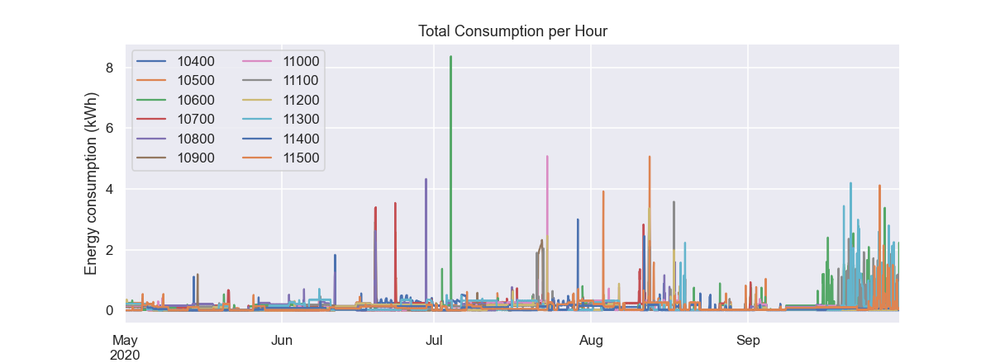

In [24]:
### Figure 1 - Hourly Consumption 
sns.set(rc={'figure.figsize': (11, 4)})
sns.set(style='darkgrid')
hourly_consumption.plot(xlabel="Date",ylabel="Energy consumption (kWh)")
plt.title("Total Consumption per Hour")
plt.legend(loc = "upper left",ncol=2)
# note: meter 10000 is "check meter"; meter 10100 is "house meter", meter 10200 - "commercial tennant 1", meter 10300 -"commercial tennant 2"

<IPython.core.display.Javascript object>


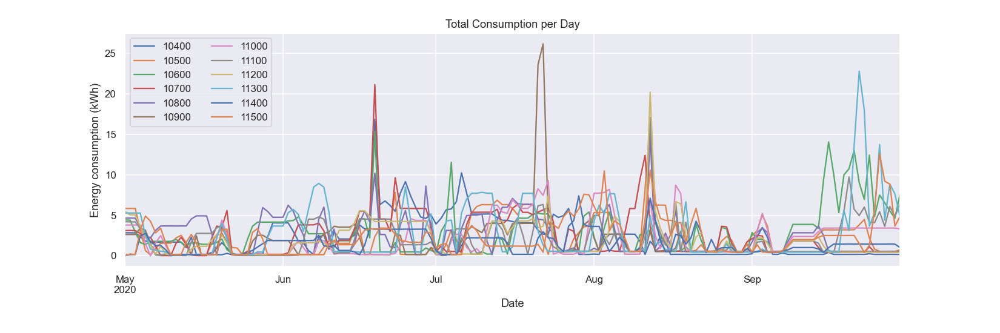

In [25]:
###  Figure 2 - Daily Consumption
sns.set(rc={'figure.figsize': (15, 5)})
daily_total.plot(xlabel="Date",ylabel="Energy consumption (kWh)",kind ='line')
# daily_total.loc[:,10400].plot(xlabel="Date",ylabel="Energy consumption (kWh)",kind ='line') ## For individual meter 
plt.title("Total Consumption per Day")
plt.legend(loc = "upper left",ncol=2)
plt.subplots_adjust(bottom = 0.2, top = 0.9, wspace = 0.2, hspace= 0.4)

<IPython.core.display.Javascript object>


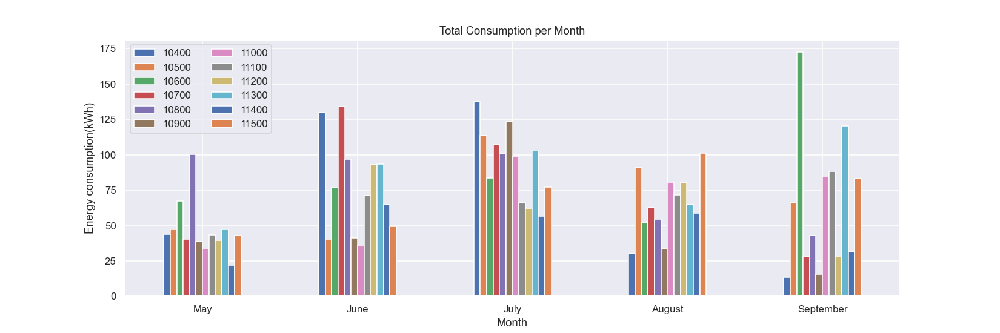

In [26]:
### Figure 3 - Monthly Consumption
monthly_total.plot(kind='bar',x='month')
# monthly_total.plot(kind='line')
plt.title("Total Consumption per Month")
plt.xlabel("Month")
plt.ylabel("Energy consumption(kWh)")
plt.xticks(rotation=0)
plt.legend(loc = 'upper left',ncol=2)

<IPython.core.display.Javascript object>


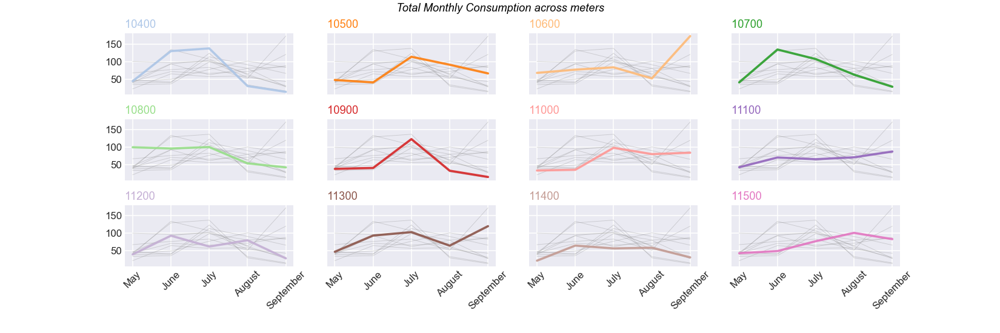

In [30]:
### Highlights individual meter consumption of Figure 2
# Number of Meters should be no more than 12 
plt.style.use('seaborn-darkgrid')
palette = plt.get_cmap('tab20')
num = 0
for column in monthly_total.drop('month',axis=1):
    num+=1
    plt.subplot(3,4,num)
    for v in monthly_total.drop('month',axis =1):
        plt.plot(monthly_total['month'],monthly_total[v],marker ='', color = 'grey', linewidth = 0.6, alpha=0.3)
    plt.plot(monthly_total['month'],monthly_total[column], marker='', color=palette(num), linewidth=2.4, alpha=0.9, label=column)
    plt.xticks(rotation=45)
    if num in range(9):
        plt.tick_params(labelbottom= False)
    if num not in [1,5,9]:
        plt.tick_params(labelleft=False)
    plt.title(column, loc='left', fontsize=12, fontweight=0, color=palette(num))
plt.suptitle("Total Monthly Consumption across meters", fontsize=12,fontweight=0, color='black', style='italic', y=0.99)
plt.subplots_adjust(left = 0.125, right = 0.9, bottom = 0.2, top = 0.9, wspace = 0.2, hspace= 0.4)
plt.show()

FacetGrids to analyse the patterns of Energy Consumption across meters

<IPython.core.display.Javascript object>


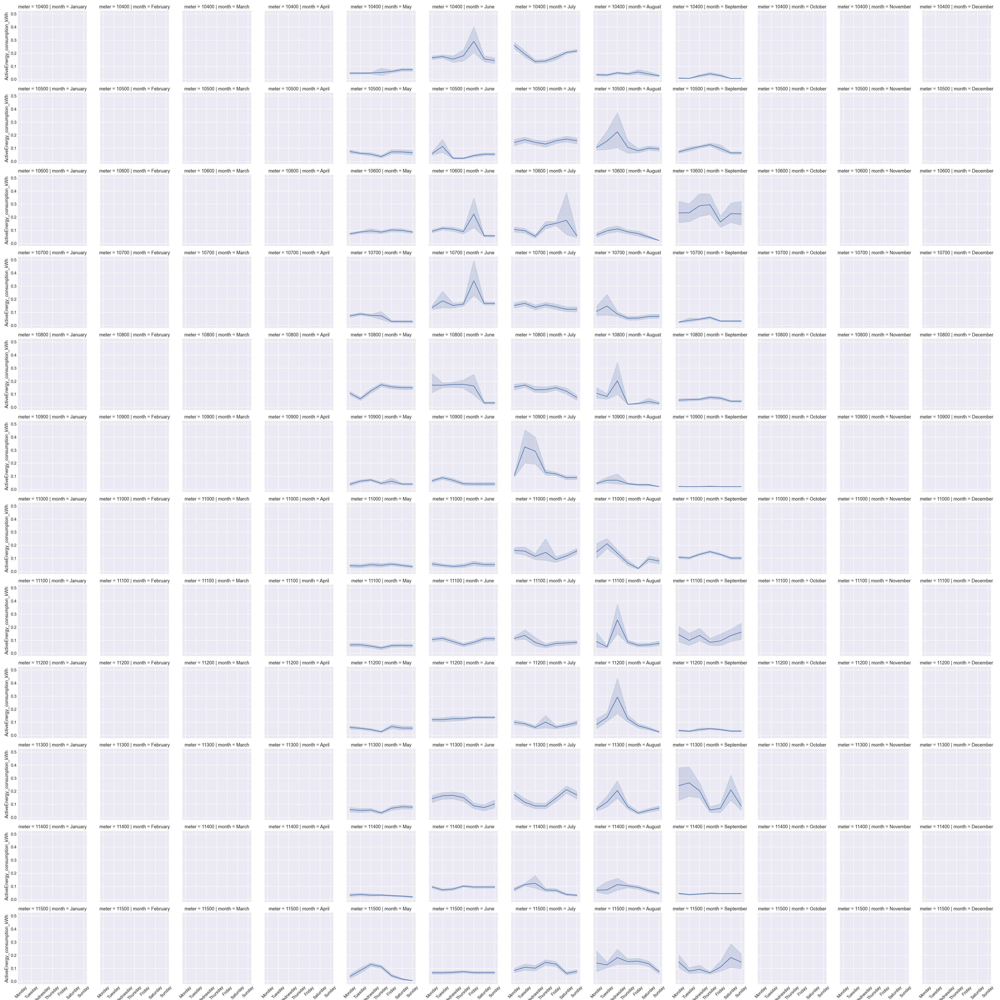

In [31]:
## lineplot aggregates repeated values and displays the mean with 95% CI
e  = sns.FacetGrid(EnergyConsumption_df, col = 'month',row = 'meter')
e.map(sns.lineplot,'day','ActiveEnergy_consumption_kWh')
e.set_xticklabels(rotation=45)

<IPython.core.display.Javascript object>


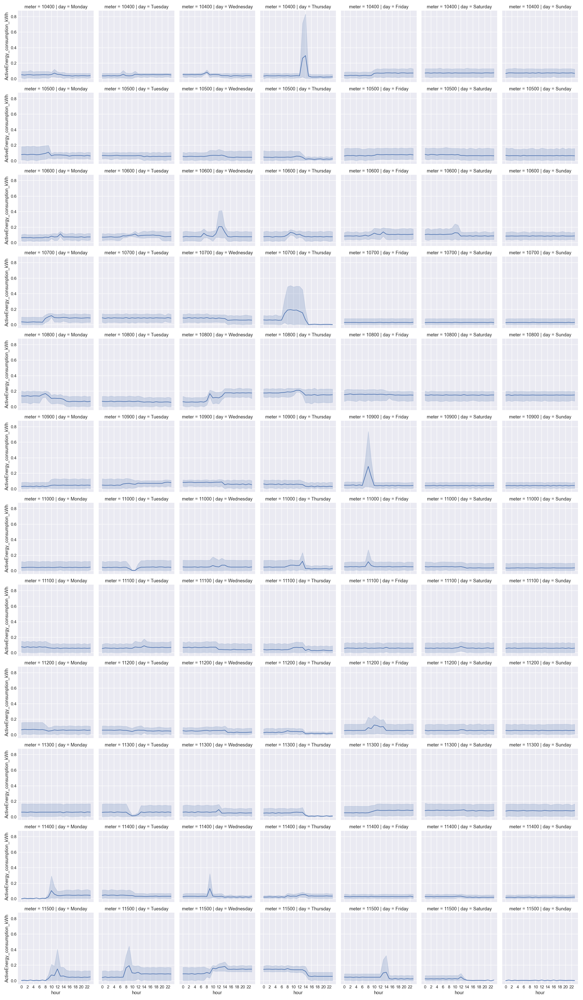

Wall time: 46.2 s


In [32]:
%%time
###  Select which month to analyse (i.e. August)
M = EnergyConsumption_df.groupby(['month']).get_group('May')
Mo = sns.FacetGrid(M,col='day', row = 'meter')
Mo.map(sns.lineplot,'hour','ActiveEnergy_consumption_kWh')
Mo.set(xticks=range(0,24,2))

<IPython.core.display.Javascript object>


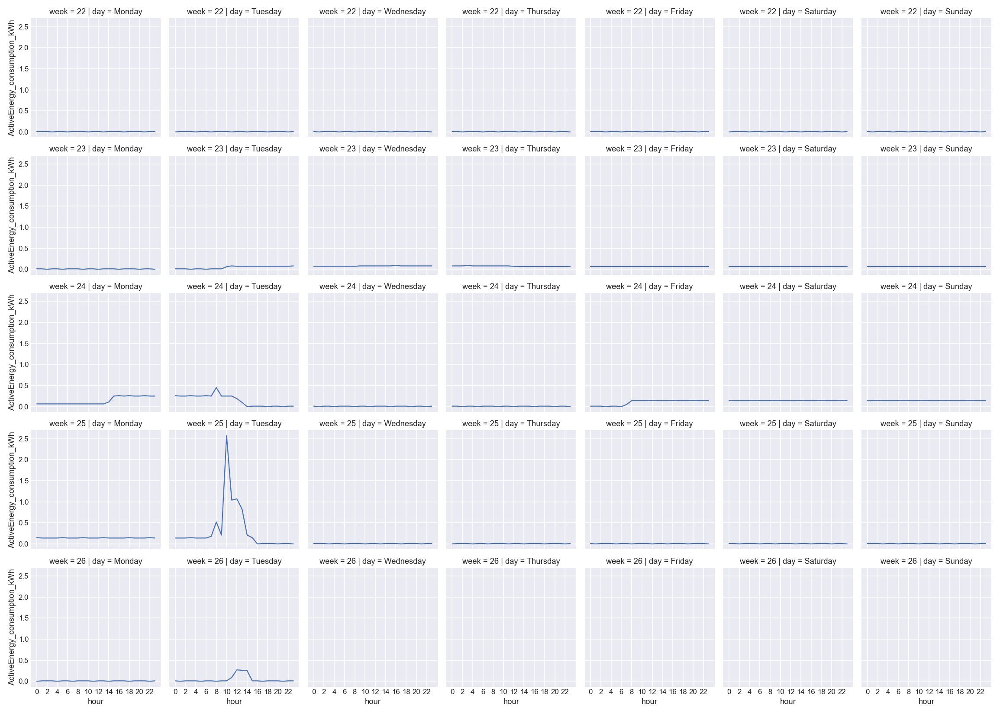

Wall time: 3.3 s


In [33]:
%%time 
### Matches with Optergy graphs
###  Select which month and meter to analyse (i.e. August)
S = EnergyConsumption_df.groupby(['month','meter']).get_group(("June",10500))
Sep = sns.FacetGrid(S,col='day', row = 'week')
Sep.map(sns.lineplot,'hour','ActiveEnergy_consumption_kWh')
# Sep.map(sns.barplot,'hour','ActiveEnergy_consumption_kWh')
Sep.set(xticks=range(0,24,2))

Determine the instances of Peak consumption per day or week 

In [34]:
### Instance of Maximum hourly consumption per day
## Select individual meter to analyse consumption patterns 
meter_i = EnergyConsumption_df[EnergyConsumption_df['meter']==10500]
Max_df = meter_i[meter_i['ActiveEnergy_consumption_kWh']==meter_i.groupby(['week','day'])['ActiveEnergy_consumption_kWh'].transform('max')]
Max_df = Max_df[['meter','time_hourly','month','week','day','hour','ActiveEnergy_consumption_kWh']]
# Max_df['ActiveEnergy_consumption_kWh'].describe()
Max_df
## TODO: Remove occurrences when maximum consumption occurs more than once throughout the day

,meter,time_hourly,month,week,day,hour,ActiveEnergy_consumption_kWh
3676,10500,2020-05-01 04:00,May,17,Friday,4,0.25
3679,10500,2020-05-01 07:00,May,17,Friday,7,0.25
3682,10500,2020-05-01 10:00,May,17,Friday,10,0.25
3686,10500,2020-05-01 14:00,May,17,Friday,14,0.25
3696,10500,2020-05-02 00:00,May,17,Saturday,0,0.25
...,...,...,...,...,...,...,...
7307,10500,2020-09-29 11:00,September,39,Tuesday,11,0.03
7311,10500,2020-09-29 15:00,September,39,Tuesday,15,0.03
7314,10500,2020-09-29 18:00,September,39,Tuesday,18,0.03
7318,10500,2020-09-29 22:00,September,39,Tuesday,22,0.03


<IPython.core.display.Javascript object>


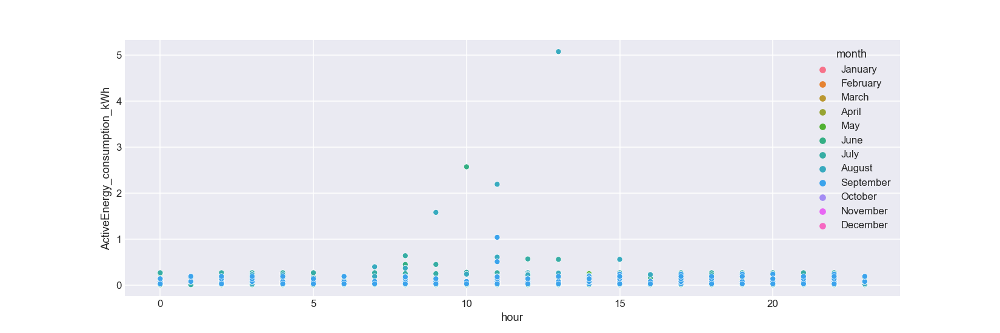

<AxesSubplot:xlabel='hour', ylabel='ActiveEnergy_consumption_kWh'>

In [35]:
# Hour of day against Maximum Energy Consumption 
sns.scatterplot(data=Max_df, x ='hour',y='ActiveEnergy_consumption_kWh',hue='month')

In [36]:
# Frequency of maximum energy consumption based on hour of day 
sns.displot(data=Max_df, x ='hour',hue ='month',multiple ='stack')
# sns.displot(data=Max_df, x ='hour',bins=24)

<IPython.core.display.Javascript object>

In [37]:
### TODO: Filter data to ensure that a week only has one entry for the maximum daily consumption 
meter_i_d = E_daily[E_daily['meter']==10500]
Max_w_df =meter_i_d[meter_i_d['ActiveEnergy_consumption_kWh']==meter_i_d.groupby(['week'])['ActiveEnergy_consumption_kWh'].transform('max')]
Max_w_df = Max_w_df[['meter','time_day','month','week','day','ActiveEnergy_consumption_kWh']]
Max_w_df

,meter,time_day,month,week,day,ActiveEnergy_consumption_kWh
154,10500,2020-05-02,May,17,Saturday,5.840000
156,10500,2020-05-04,May,18,Monday,3.220000
164,10500,2020-05-12,May,19,Tuesday,2.530000
172,10500,2020-05-20,May,20,Wednesday,3.420000
177,10500,2020-05-25,May,21,Monday,0.300000
184,10500,2020-06-01,June,22,Monday,0.180000
188,10500,2020-06-05,June,22,Friday,0.180000
193,10500,2020-06-10,June,23,Wednesday,1.840000
199,10500,2020-06-16,June,24,Tuesday,3.590000
206,10500,2020-06-23,June,25,Tuesday,7.820000


<IPython.core.display.Javascript object>


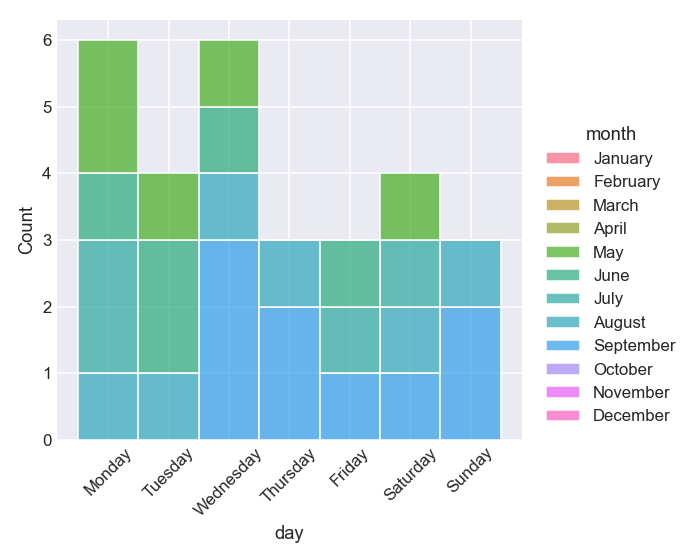

In [38]:
sns.displot(data=Max_w_df, x ='day',hue='month',multiple='stack')
plt.xticks(rotation=45)
plt.subplots_adjust(bottom=0.2)

Visual Data of Power_df DataFrame

Filter Data by month and meter for an overview

<IPython.core.display.Javascript object>


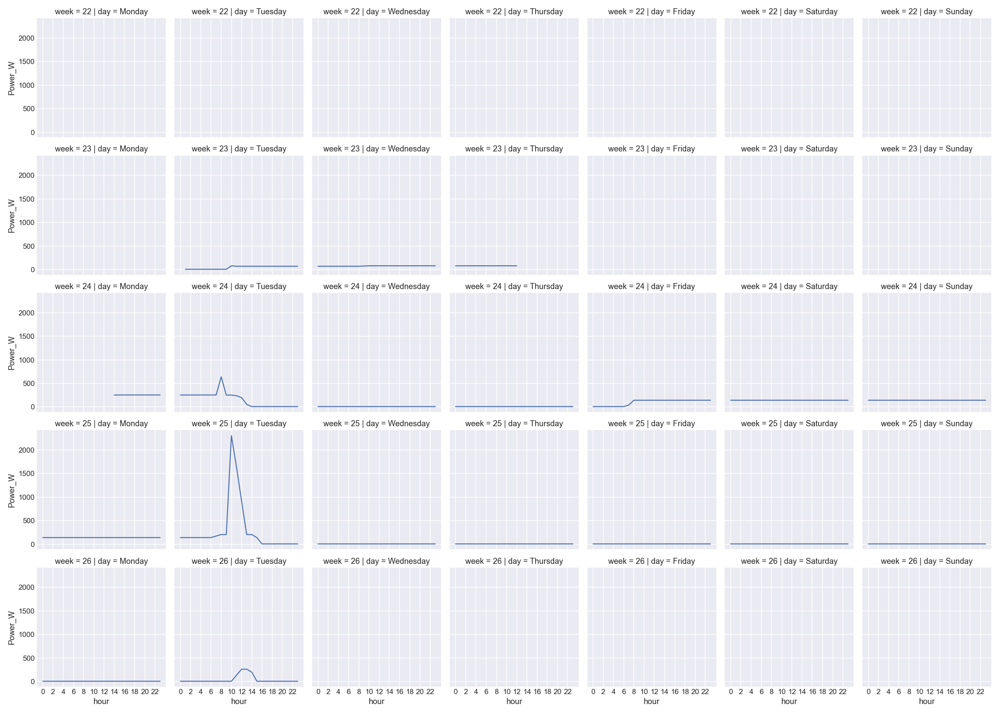

In [39]:
### Plot Instantaneous Power (W) (filter by meter and month) 
## Does not match Optergy Demand(kW) Graphs
##  Select which month and meter to analyse (i.e. August)
S = Power_df.groupby(['month','meter']).get_group(("June",10500))
Sep = sns.FacetGrid(S,col='day', row = 'week')
Sep.map(sns.lineplot,'hour','Power_W')
Sep.set(xticks=range(0,24,2))

<IPython.core.display.Javascript object>


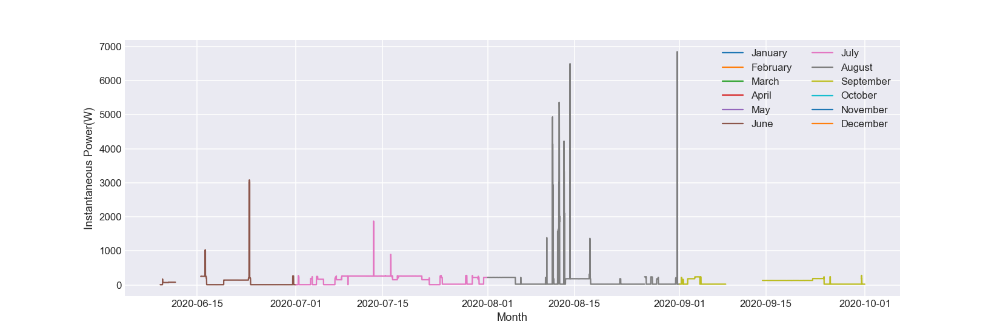

In [41]:
### Instantaneous Power Demand 
meter10500= raw_df.query("meter==10500")
sns.lineplot(data=meter10500,x='time',y='Power_W',hue='month',palette='tab10')
plt.xlabel("Month")
plt.ylabel("Instantaneous Power(W)")
plt.legend(loc = 'upper right',ncol=2)
## NaN entries for May 

<IPython.core.display.Javascript object>


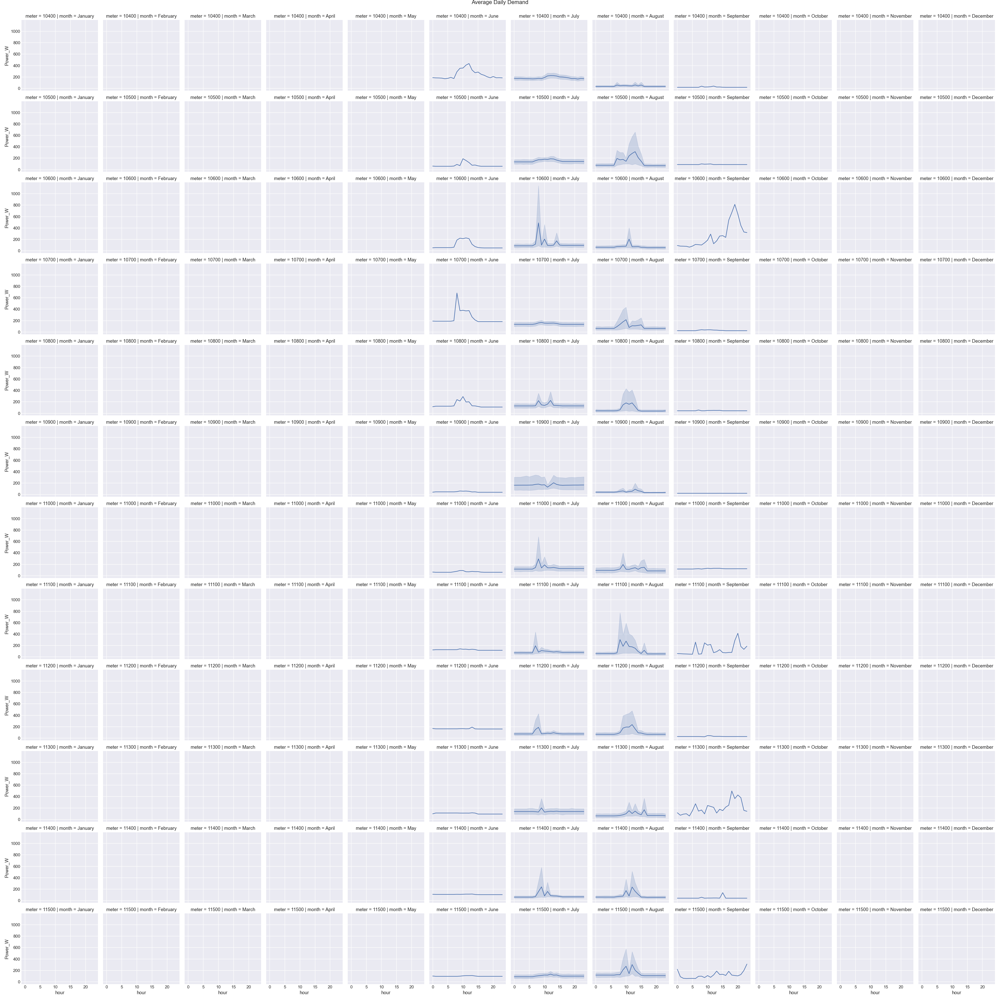

Text(0.5, 1.0, 'Average Daily Demand')

In [42]:
### Average Daily Demand per month 
p = sns.FacetGrid(Power_df,col = 'month', row = 'meter',sharey=True)
p.map(sns.lineplot,'hour','Power_W')
plt.subplots_adjust(top=0.98)
p.fig.suptitle('Average Daily Demand',y = 1.0)

In [43]:
### Average Weekly Demand per month 
p = sns.FacetGrid(Power_df,col = 'month', row = 'meter')
p.map(sns.lineplot,'day','Power_W')
p.set_xticklabels(rotation=45)
plt.subplots_adjust(top=0.98)
p.fig.suptitle('Average Weekly Demand', y =1.0)

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Average Weekly Demand')

<IPython.core.display.Javascript object>


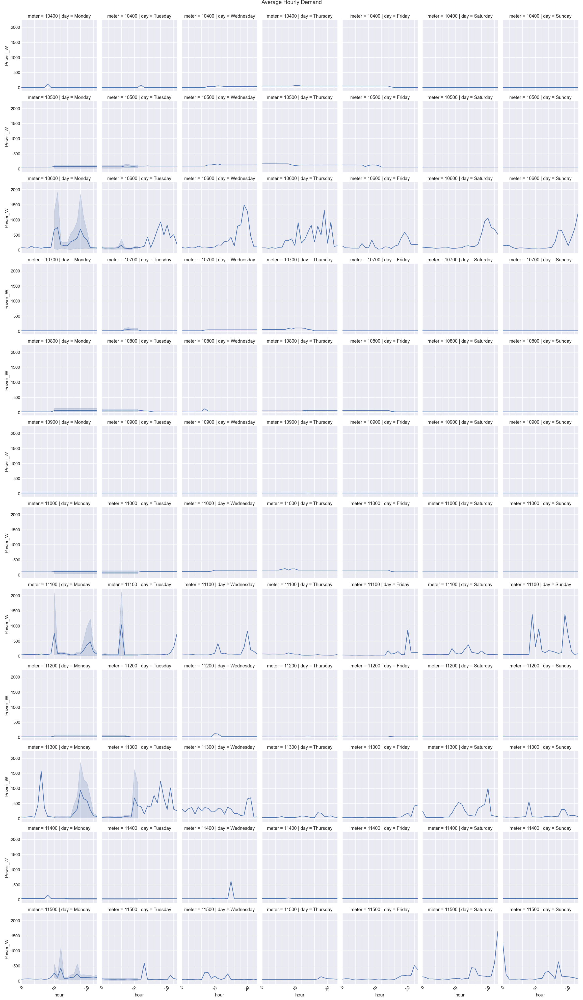

Text(0.5, 1.0, 'Average Hourly Demand')

In [44]:
### Hourly demand for September 
p_s = Power_df.groupby(['month']).get_group("September")
p = sns.FacetGrid(p_s,col = 'day', row = 'meter')
p.map(sns.lineplot,'hour','Power_W')
p.set_xticklabels(rotation=45)
plt.subplots_adjust(top=0.98)
plt.xlim(0,23)
p.set(xticks=range(0,24,2))
p.fig.suptitle('Average Hourly Demand',y =1.0)

Frequency Distribution Plots 

<IPython.core.display.Javascript object>


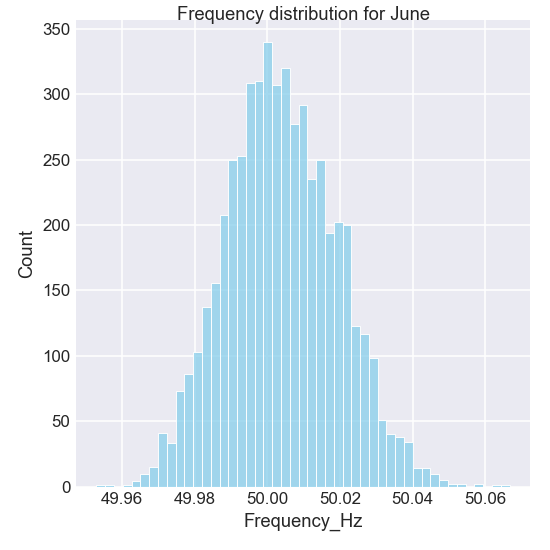

<IPython.core.display.Javascript object>


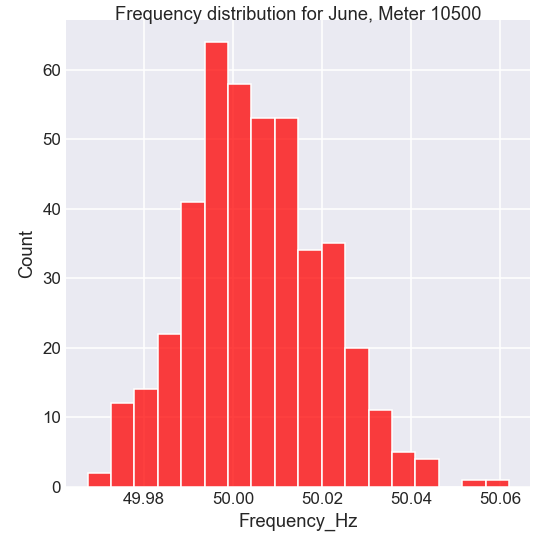

Text(0.5, 0.98, 'Frequency distribution for June, Meter 10500')

In [45]:
### Frequency plots
June = Frequency_df.groupby(['month']).get_group("June")
June_meter= Frequency_df.groupby(["month","meter"]).get_group(("June",10500))

sns.displot(June['Frequency_Hz'] , color="skyblue")
plt.title("Frequency distribution for June",y =0.98)
sns.displot(June_meter['Frequency_Hz'] , color="red")
plt.title("Frequency distribution for June, Meter 10500",y = 0.98)

Visualise Data for Electric Current

Filter Data by month and meter

<IPython.core.display.Javascript object>


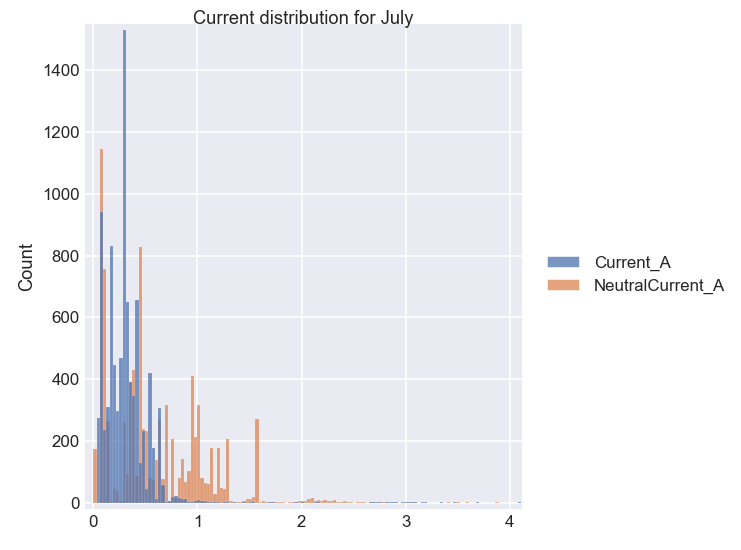

<IPython.core.display.Javascript object>


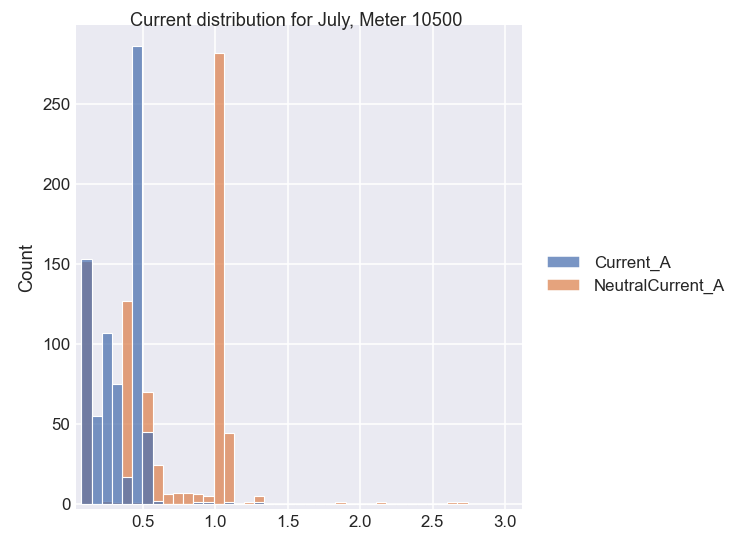

Text(0.5, 0.98, 'Current distribution for July, Meter 10500 ')

In [46]:
### Electric Current plots
July = Current_df.groupby(['month']).get_group("July")
July_meter= Current_df.groupby(["month","meter"]).get_group(("July",10500))

sns.displot((July['Current_A'],July['NeutralCurrent_A']))
plt.ylim(0,2000)
plt.xlim(-1,10)
plt.title("Current distribution for July",y=0.98)

sns.displot((July_meter['Current_A'],July_meter['NeutralCurrent_A']))
plt.ylim(0,500)
plt.xlim(0,10)
plt.title("Current distribution for July, Meter 10500 ",y=0.98)

Additional Plots require interpretation of analysis

Autocorrelation plots may be more useful when larger sets of Data are available. 

<IPython.core.display.Javascript object>


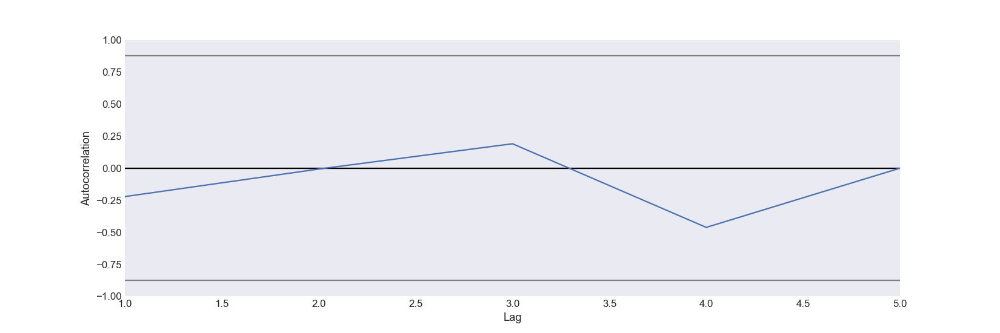

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

In [47]:
### Autocorrelation plot
df_m1 = raw_df[raw_df["meter"] == 11500]
df_m1 = df_m1.set_index('time')
pd.plotting.autocorrelation_plot(df_m1["ActiveEnergy_consumption_kWh"].resample("1m").median())

In [48]:
### Pairplot 
df_small = df_m1[['ActiveEnergy_consumption_kWh','Frequency_Hz','Current_A','Power_W','month']]
sns.pairplot(df_small,hue = 'month',palette = 'tab10')

<IPython.core.display.Javascript object>

C:\Users\oluntung\Anaconda3\envs\Source\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\oluntung\Anaconda3\envs\Source\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\oluntung\Anaconda3\envs\Source\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
